In [ ]:

import anndata as ad
import scanpy as sc
import loompy
import scvelo as scv
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import pandas as pd

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization



In [4]:
cd '/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Female/24W_Control_vs_24W_HF'

/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Female/24W_Control_vs_24W_HF


In [5]:
adata = sc.read('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Full_taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [7]:

# This has data from all celltypes, not just brown adipocytes
ldata_24W_Control_Female = scv.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Loom_Files/Control_Female_24W.loom', cache=False)
# This has data from all celltypes, not just brown adipocytes
ldata_24W_HF_Female = scv.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/scVelo/Loom_Files/HF_Female_24W.loom', cache=False)




In [8]:
adata_24W_Control_Females = scv.utils.merge(adata, ldata_24W_Control_Female)
adata_24W_HF_Females = scv.utils.merge(adata, ldata_24W_HF_Female)

In [9]:
# Merge along observations (add cells)
adata = ad.concat([adata_24W_Control_Females, adata_24W_HF_Females], join='outer')

In [10]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'F']
adata = adata[adata.obs['time'] == '24W']

In [11]:
adata

View of AnnData object with n_obs × n_vars = 5637 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    layers: 'counts', 'raw_counts', 'soupX_counts', 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [12]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'Error'



In [13]:

adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

In [14]:
adata.obs[adata.obs.time_diet == 'Error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,time_diet


# Preprocess
 https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html

 https://scvelo.readthedocs.io/en/stable/getting_started.html

In [15]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 9443 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [16]:
sc.tl.diffmap(adata)

In [17]:
adata

AnnData object with n_obs × n_vars = 5637 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'time_diet', 'n_counts'
    var: 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'log1p', 'pca', 'neighbors', 'diffmap_eva

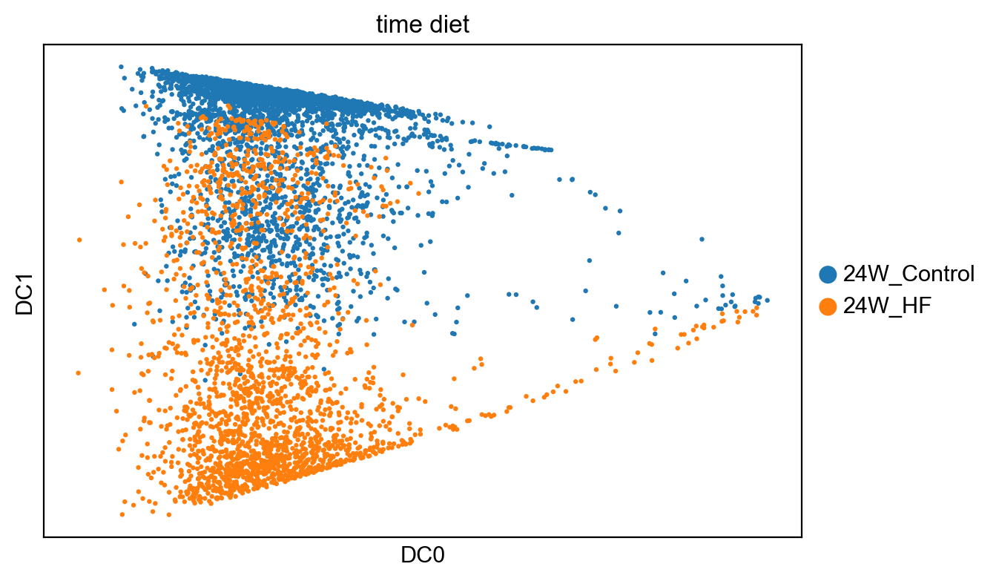

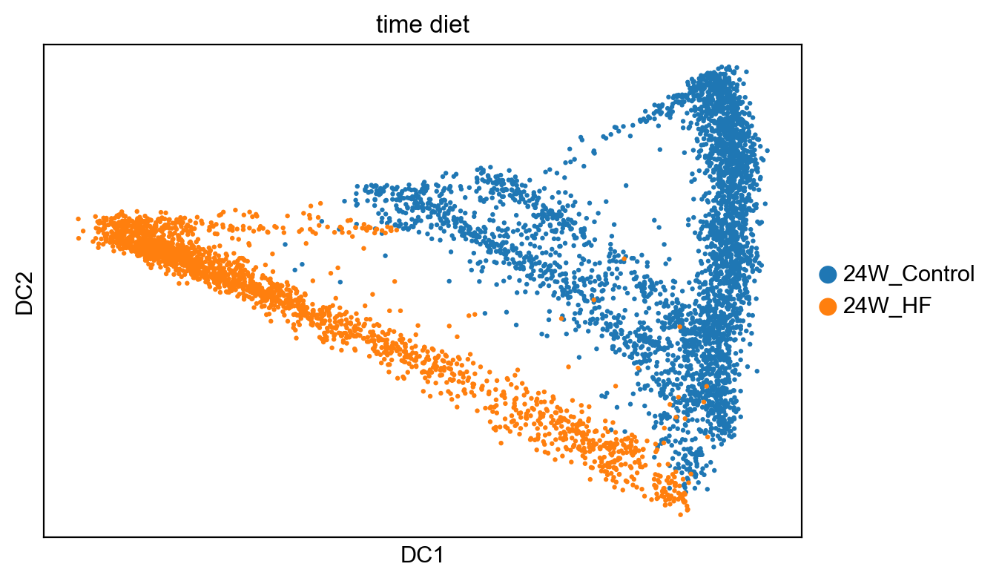

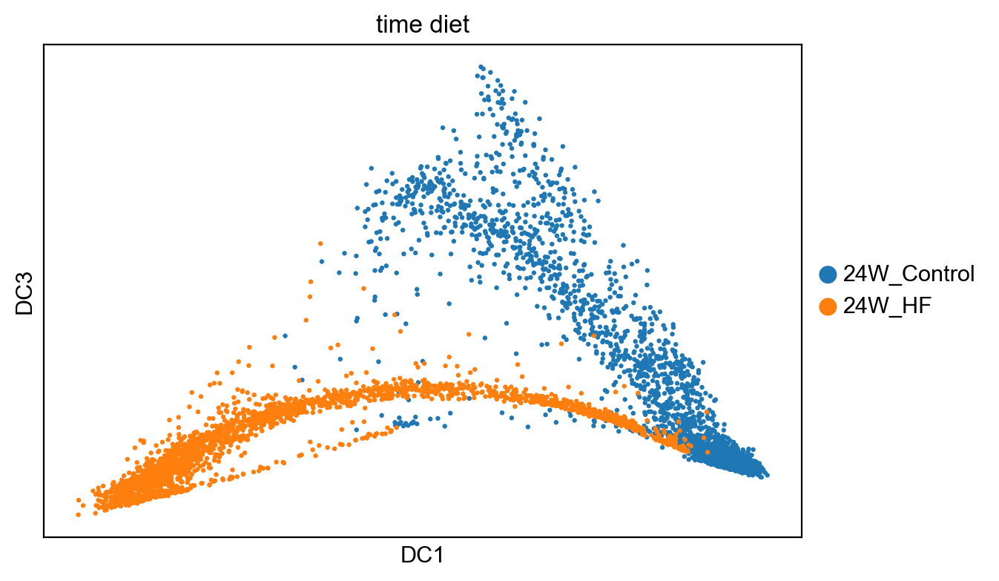

In [18]:
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[0, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 2],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
    
)

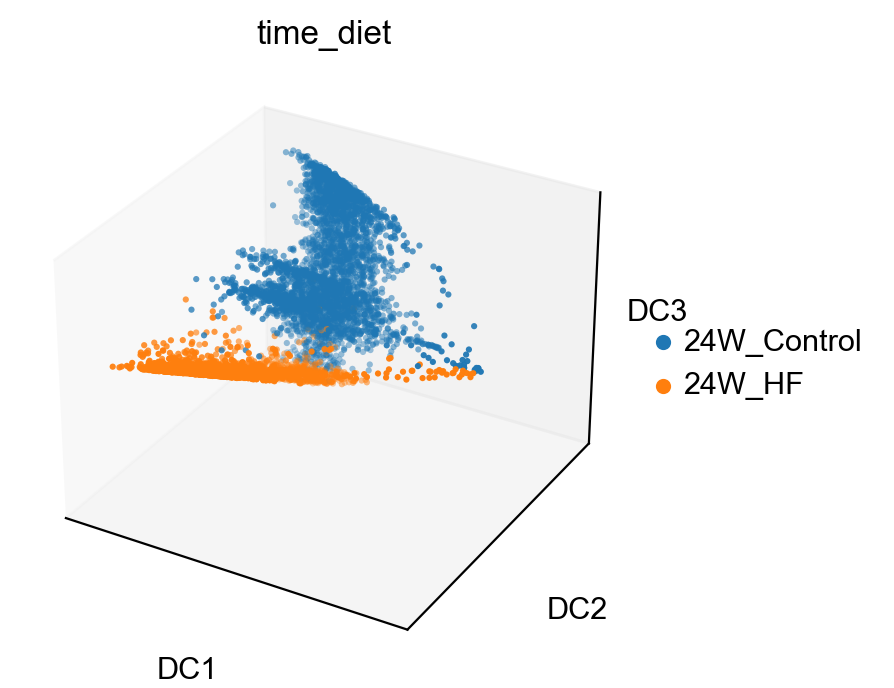

In [19]:
sc.pl.diffmap(adata, color = 'time_diet', projection = '3d')

In [20]:
scv.tl.umap(adata)

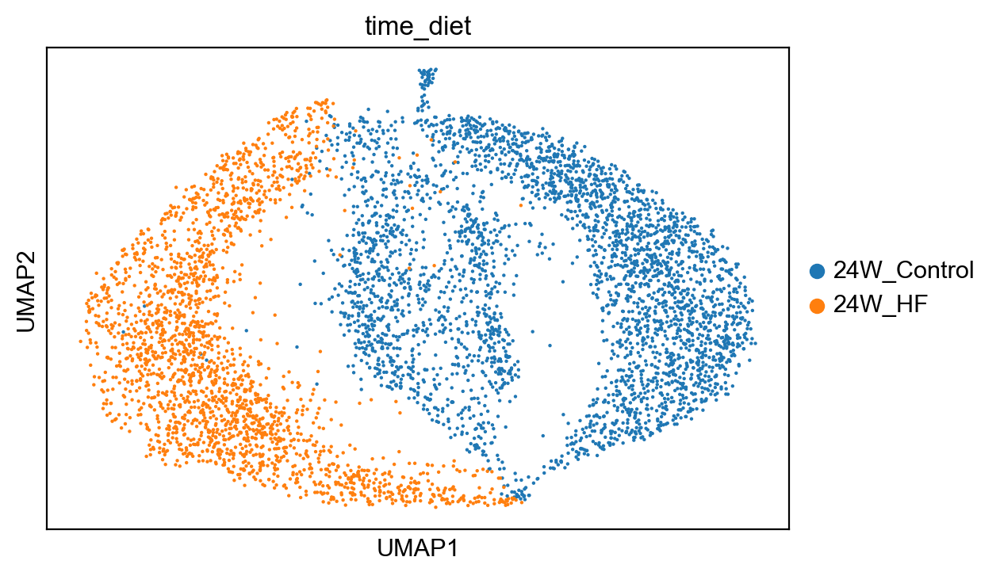

In [21]:
sc.pl.umap(adata, color=["time_diet"], size=10)

In [22]:
scv.tl.recover_dynamics(adata, n_jobs=-1) # n_jobs = -1 means that all available cores will be used

recovering dynamics (using 10/10 cores)
False
False
False
False


  0%|          | 0/152 [00:00<?, ?gene/s]

FalseFalse

FalseFalse

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

In [23]:
# mode = 'dynamical' using the likelihood-based dynamical model [Bergen et al., 2020] solves the full splicing kinetics 
# and generalizes RNA velocity estimation to transient systems. 
# It is also capable of capturing non-observed steady states.

# scv.tl.recover_dynamics must be run first
scv.tl.velocity(adata, mode='dynamical', groupby='time_diet')

computing velocities
False
False
False
False
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [24]:
scv.tl.velocity_graph(adata, n_jobs = -1)

computing velocity graph (using 10/10 cores)


  0%|          | 0/5637 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


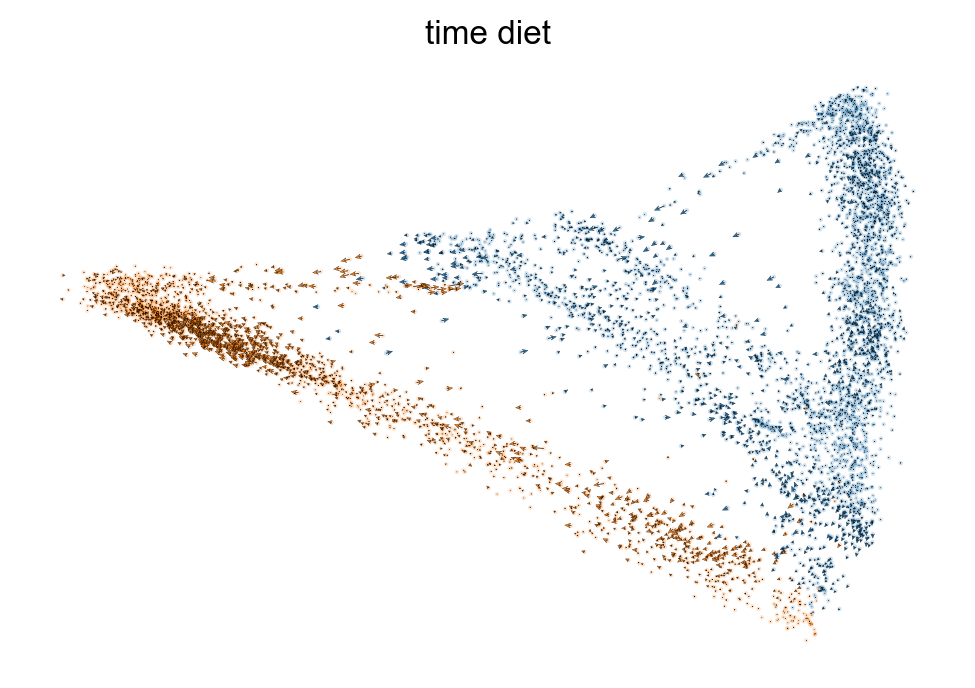

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


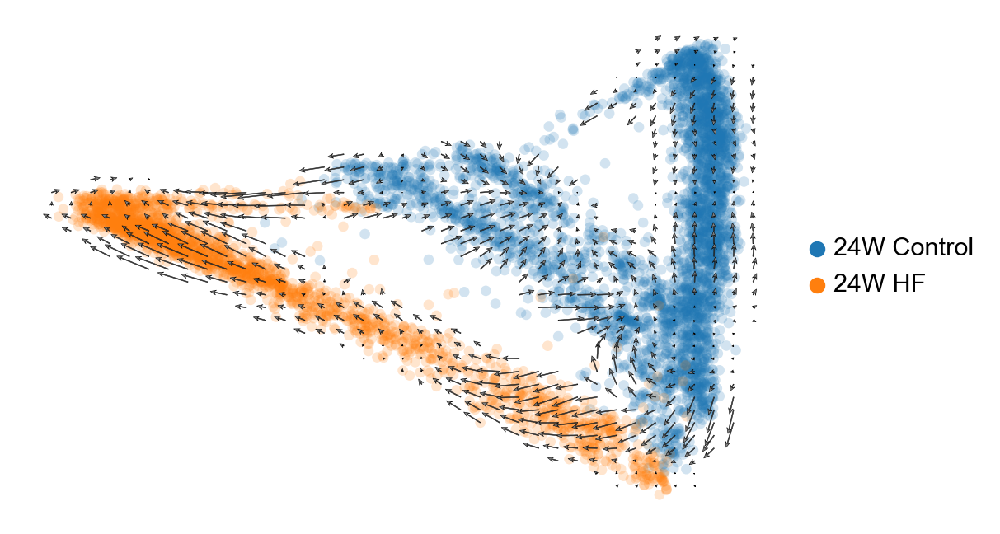

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


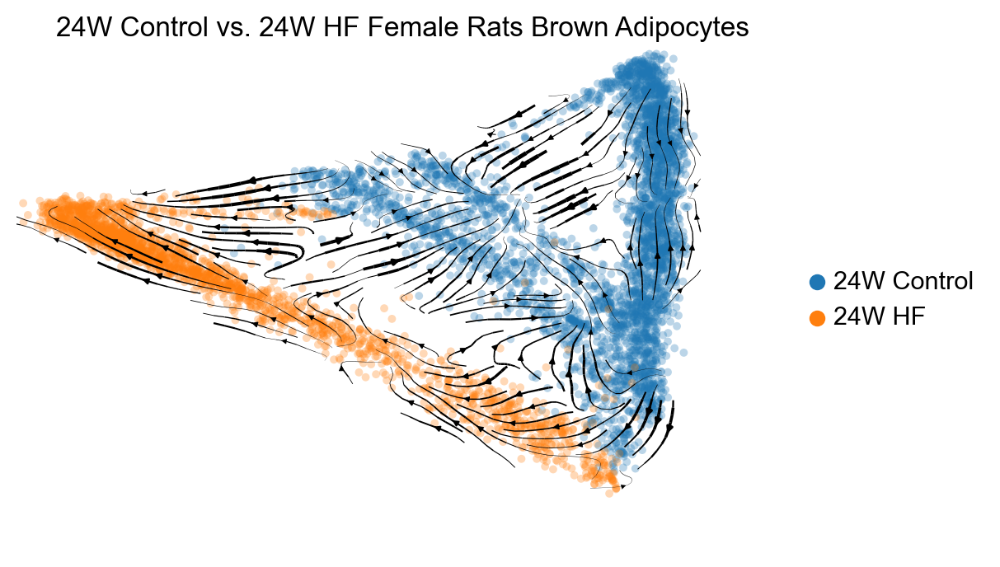

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


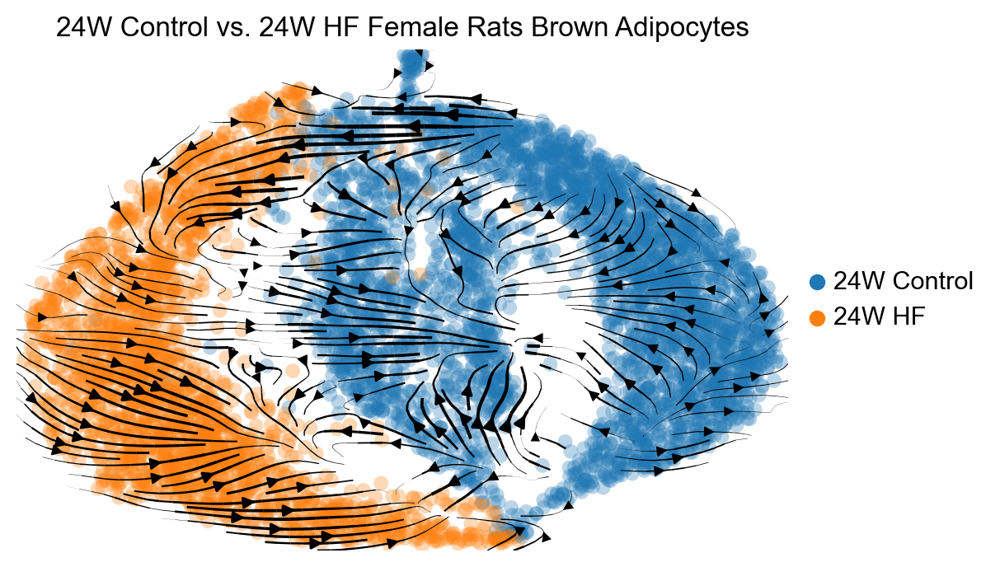

In [40]:
scv.pl.velocity_embedding(adata, basis='diffmap', color = 'time_diet',)
scv.pl.velocity_embedding_grid(adata, basis='diffmap', color = 'time_diet', arrow_length=2, arrow_size = 1.25, min_mass= 10, smooth=1,
                               density=0.75, legend_loc = 'right margin',
                               title='')

scv.pl.velocity_embedding_stream(adata, basis='diffmap', color = ['time_diet'], 
                                 legend_loc='right margin', title= '24W Control vs. 24W HF Female Rats Brown Adipocytes',
                                 arrow_size = 0.5, max_length = 1, size = 50, density= 2,
                                 ncols=1)

scv.pl.velocity_embedding_stream(adata, basis='umap', color = ['time_diet'], 
                                 legend_loc='right margin', title= '24W Control vs. 24W HF Female Rats Brown Adipocytes',
                                 arrow_size = 1, max_length = 4, ncols= 1)


# Starting Kinetic Rate Parameters 
### https://scvelo.readthedocs.io/en/stable/DynamicalModeling.html

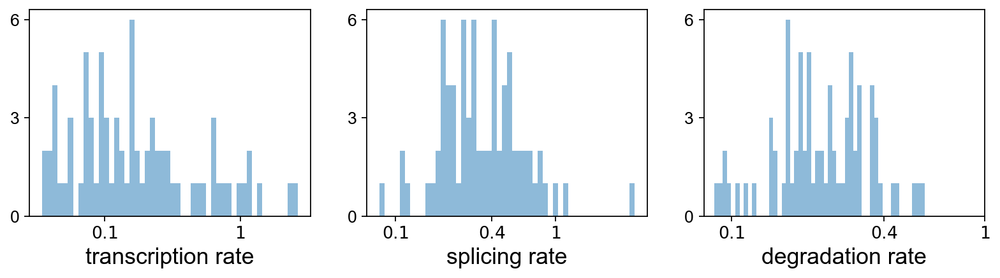

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
AABR07044388.2,0.417045,0.197649,0.675251,0.298876,5.701267,0.791667,0.082787,0.130271,0.130127,0.0,0.0,0.436489,0.202996,0.353385,0.996300,2.142412
Abcc9,0.550709,0.062973,0.066425,0.108514,20.808519,2.907584,0.270615,0.091366,0.024000,0.0,0.0,0.452337,0.752432,0.391669,1.031520,5.805052
Abcd2,0.036199,0.043911,0.088599,0.190175,7.555594,4.155113,0.181564,0.044352,0.193337,0.0,0.0,0.237253,0.636665,0.132879,1.385619,2.757098
Abi3bp,0.044408,0.041069,0.083840,0.069699,26.657857,2.349231,0.154090,0.089287,0.000022,0.0,0.0,0.476839,0.470183,0.450842,0.467303,7.025521
Acaca,0.891708,2.428278,0.089297,0.320673,8.285223,2.310438,8.394921,1.635064,0.559868,0.0,0.0,0.465671,22.235685,4.141975,0.180171,2.181129


In [26]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

In [27]:
#scv.get_df(adata, 'fit*', dropna=True).sort_values('fit_likelihood').head(25)

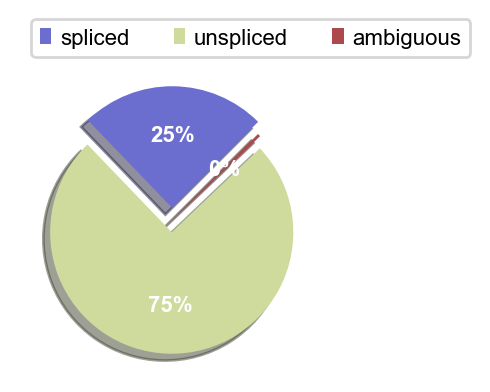

In [28]:
scv.pl.proportions(adata)

# Starting Latent Time 
### https://scvelo.readthedocs.io/en/stable/DynamicalModeling.html

computing terminal states
T_roots shape: (5637, 5637)
T_roots (sample): <Compressed Sparse Row sparse matrix of dtype 'float32'
	with 2 stored elements and shape (5, 5)>
  Coords	Values
  (2, 3)	0.06623503565788269
  (3, 2)	0.005276666022837162
Eigenvectors_roots (first): [0.0149358048 0.0105170651 0.004153936  0.0036809139 0.0194187114]
Eigenvectors_roots (second): [0.4471171721 0.1767562439 0.0747729382 0.0792141234 0.6219587781]
Roots: [0.0161343244 0.437246197  4.2683713615 ... 0.0123882781 0.0138870676
 0.0239026628]
Roots_after_scale: [0.0175134432 0.4893085624 1.           ... 0.0133165387 0.0149957161
 0.0262167461]
Roots_after_verify_roots: [0.0175134432 0.4893085624 1.           ... 0.0133165387 0.0149957161
 0.0262167461]
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


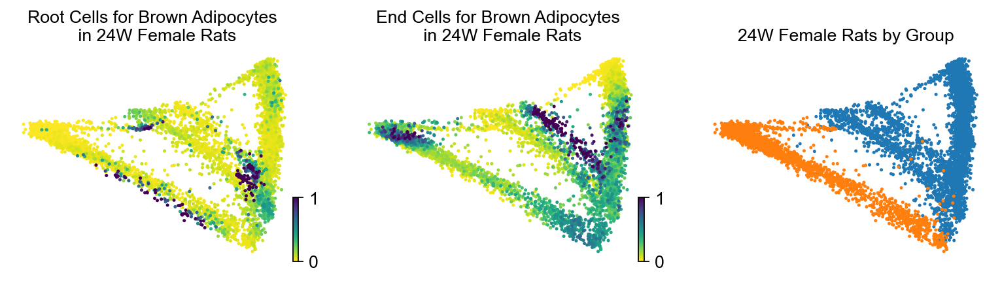

In [29]:
scv.tl.terminal_states(adata)
scv.pl.scatter(adata, color=["root_cells", "end_points",'time_diet'], basis = 'diffmap', title=['Root Cells for Brown Adipocytes \n in 24W Female Rats', 'End Cells for Brown Adipocytes \n in 24W Female Rats','24W Female Rats by Group'])

In [30]:
adata.obs

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,celltype_broad,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,time_diet,n_counts,velocity_self_transition,root_cells,end_points
AAACGCTCAGCA,P_CTRL_24W_F_02,3236,8.082402,11171.0,9.321166,10.294513,19.0,2.995732,0.170083,26.0,...,Adipocytes,AGAC-1-12,8768,2098,2098.0,24W_Control,4044.262246,0.211177,0.017513,1.000000
AAAGAACCAATA,P_CTRL_24W_F_02,433,6.073045,526.0,6.267201,15.209125,3.0,1.386294,0.570342,2.0,...,Adipocytes,CAGA-1-12,1184,549,549.0,24W_Control,699.734096,0.383851,0.489309,0.368797
AAAGAACGTCTA,P_CTRL_24W_F_02,483,6.182085,556.0,6.322565,10.791367,3.0,1.386294,0.539568,0.0,...,Adipocytes,GGCC-1-12,442,88,88.0,24W_Control,4446.897642,0.148399,1.000000,0.028878
AAAGGGCCATGG,P_CTRL_24W_F_02,459,6.131226,523.0,6.261492,10.516252,10.0,2.397895,1.912046,0.0,...,Adipocytes,AGAC-1-12,424,79,79.0,24W_Control,4378.455780,0.147376,1.000000,0.000843
AAAGTGAAGTAC,P_CTRL_24W_F_02,1096,7.000334,1730.0,7.456455,13.236994,0.0,0.000000,0.000000,6.0,...,Adipocytes,AACA-1-12,1287,368,368.0,24W_Control,3497.703620,0.644276,0.031495,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAAAC,P_HF_24W_F_03,1962,7.582229,4143.0,8.329417,10.644461,16.0,2.833213,0.386194,11.0,...,Adipocytes,TCGT-1-22,3276,776,776.0,24W_HF,4019.919964,0.288893,0.023928,0.034997
TTTGGAGGTGCC,P_HF_24W_F_03,3189,8.067776,12130.0,9.403519,12.761748,15.0,2.772589,0.123660,20.0,...,Adipocytes,GTTG-1-22,10701,1397,1397.0,24W_HF,6640.715933,0.403230,0.001297,0.155288
TTTGGTTAGACA,P_HF_24W_F_03,1590,7.372118,2990.0,8.003363,11.806020,10.0,2.397895,0.334448,8.0,...,Adipocytes,AGCC-1-22,2303,620,620.0,24W_HF,3627.635388,0.295103,0.013317,0.089043
TTTGGTTAGAGA,P_HF_24W_F_03,1026,6.934397,1566.0,7.356918,10.983397,10.0,2.397895,0.638570,5.0,...,Adipocytes,TTCA-1-22,957,560,560.0,24W_HF,2100.664331,0.242774,0.014996,0.369556


computing latent time using root_cells, end_points as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


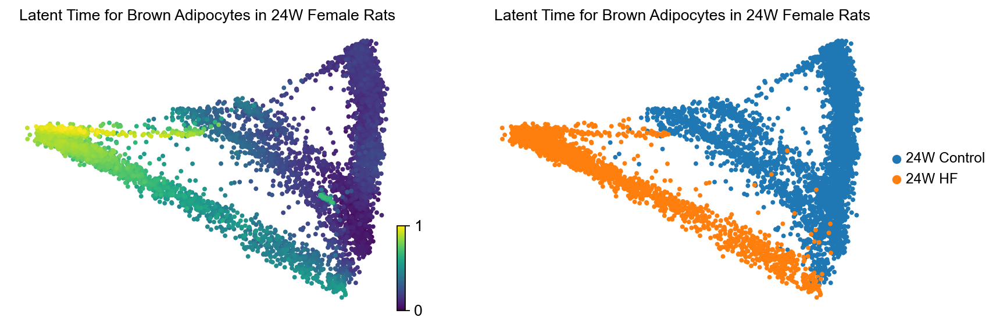

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


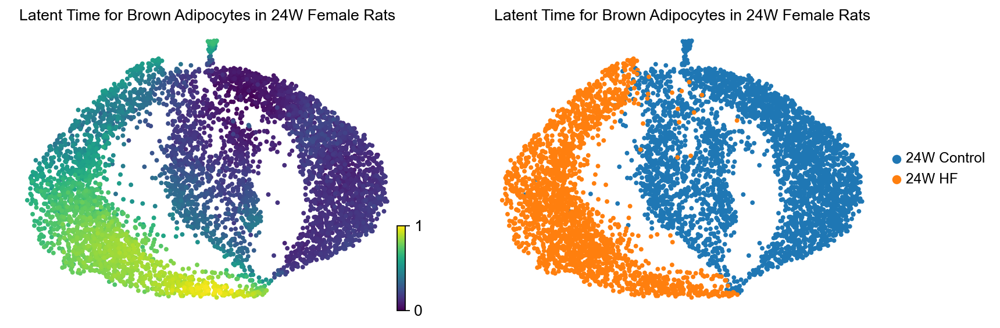

In [31]:
scv.tl.latent_time(adata, end_key='end_points', root_key='root_cells')
scv.pl.scatter(adata, color=['latent_time','time_diet'], color_map='viridis', size=50, legend_loc='right margin',basis = 'diffmap', title='Latent Time for Brown Adipocytes in 24W Female Rats')
scv.pl.umap(adata, color=['latent_time','time_diet'], color_map='viridis', size=50, legend_loc ='right_margin', title ='Latent Time for Brown Adipocytes in 24W Female Rats')


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


<Figure size 1000x2000 with 0 Axes>

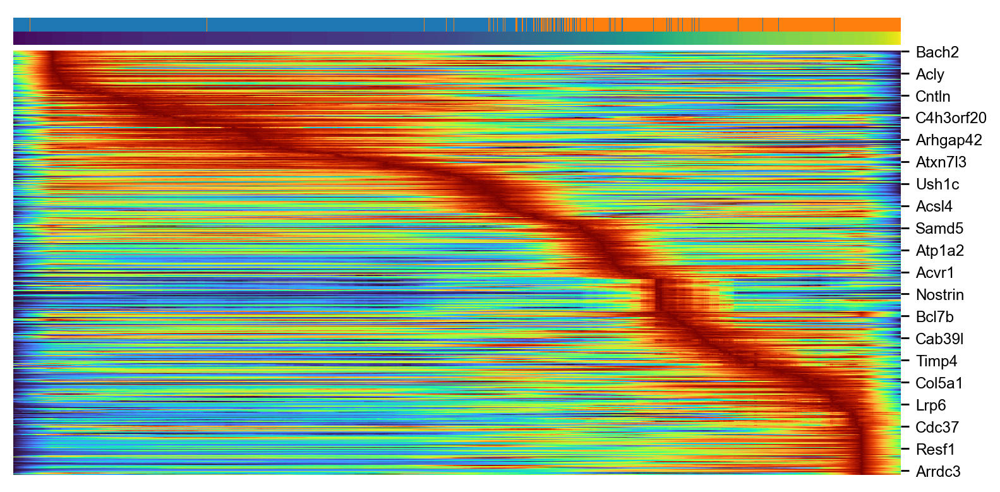

In [41]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]
#scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet','latent_time'], n_convolve=500, context='paper', colorbar=True, color_map='turbo')

plt.figure(figsize=(10, 20))
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]
heatmap = scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet', 'latent_time'], 
                    n_convolve=500, context='paper', colorbar=True, color_map='turbo', show=True)
#plt.suptitle("Gene Expression Heatmap for 24W Females Brown Adipocytes", fontsize=12, fontweight='bold', y=1.02)
#heatmap.ax_heatmap.set_yticklabels([]) 
#heatmap.ax_heatmap.set_yticks([]) 
plt.show()

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


<Figure size 1000x2000 with 0 Axes>

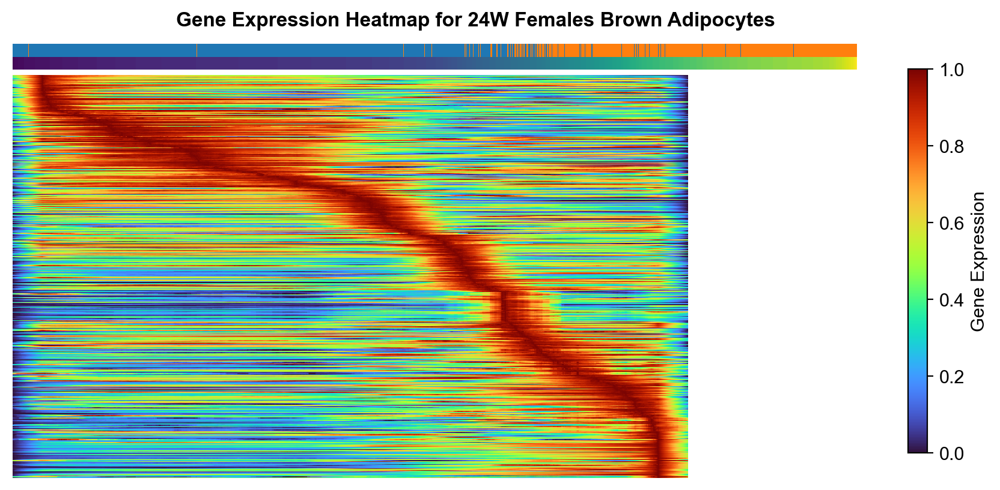

In [33]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[0:500]

plt.figure(figsize=(10, 20))
heatmap = scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color=['time_diet', 'latent_time'], 
                    n_convolve=500, context='paper', colorbar=True, color_map='turbo', show=False)
plt.suptitle("Gene Expression Heatmap for 24W Females Brown Adipocytes", fontsize=12, fontweight='bold', y=1.02)
heatmap.ax_heatmap.set_yticklabels([]) 
heatmap.ax_heatmap.set_yticks([]) 

ms_data = adata.layers['Ms']  # Extract 'Ms' data (which is the default used by scVelo)
norm = plt.Normalize(vmin=(np.min(ms_data)/np.max(ms_data)), vmax=(np.max(ms_data)/np.max(ms_data)))  # Normalize the data range to make it a colormap
cmap_ms = plt.cm.turbo  # Use the same colormap as the heatmap
sm = plt.cm.ScalarMappable(cmap=cmap_ms, norm=norm)
sm.set_array([])  # Empty array for the colorbar

# Add the colorbar to the heatmap axes (ax_heatmap)
cbar = plt.colorbar(sm, ax=heatmap.ax_heatmap, orientation="vertical", label="Gene Expression", shrink=0.75)  
cbar.ax.set_position([0.95, 0.1, 0.03, 0.8])

# Show the plot with the additional colorbar
plt.show()


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

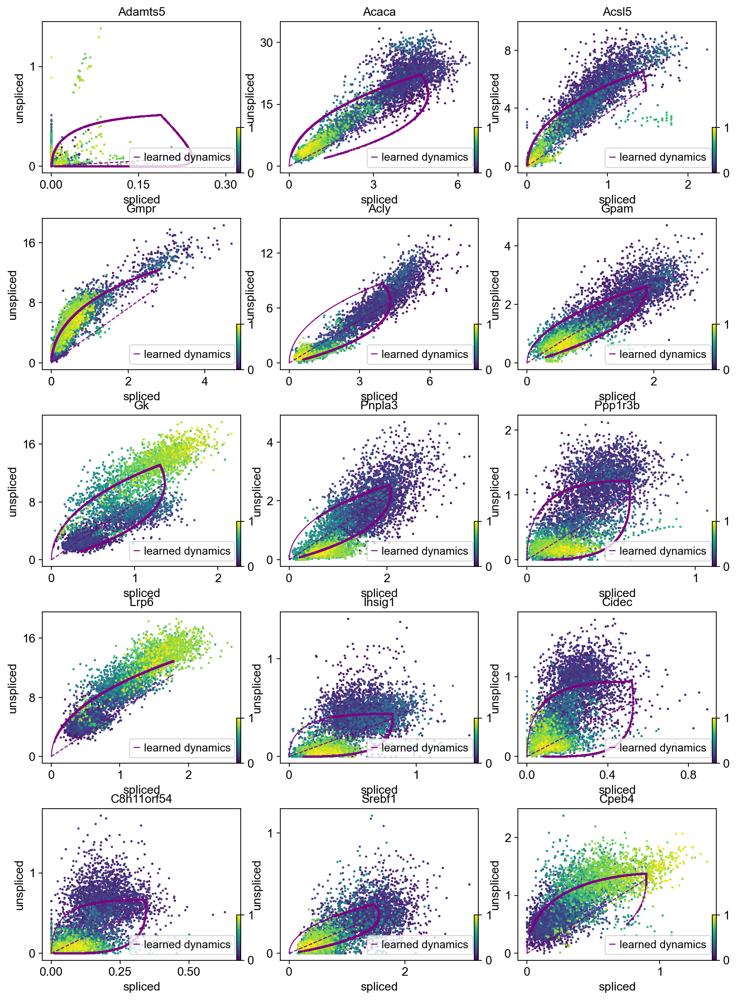

In [34]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=3, frameon=True,colorbar=True, 
               color_map='viridis', color = 'latent_time',figsize=(14,12))



/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

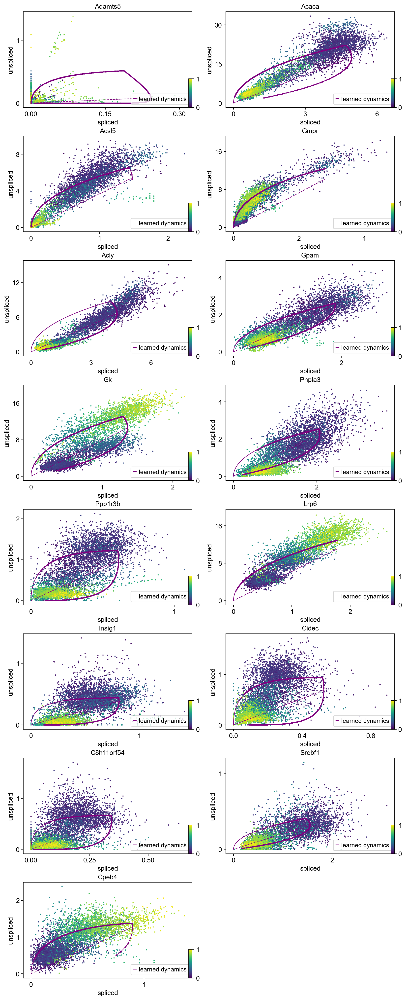

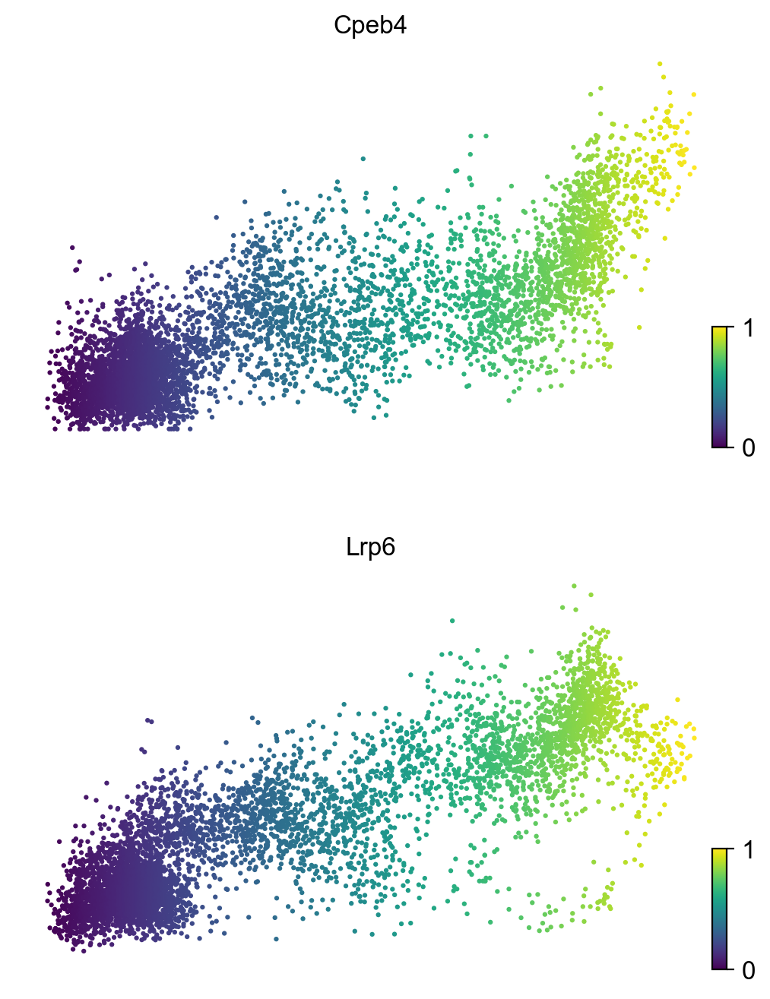

In [35]:
var_names = ['Cpeb4', 'Lrp6']
scv.pl.scatter(adata, top_genes[:15], frameon=True, color='latent_time', color_map='viridis',ncols=2)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False, colorbar=True, color_map='viridis', color = 'latent_time',ncols=1)



In [36]:
scv.tl.rank_dynamical_genes(adata, groupby='time_diet')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)



ranking genes by cluster-specific likelihoods
False
False
False
False
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/core/_anndata.py:245: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,24W_Control,24W_HF
0,Acaca,Lrp6
1,Acsl5,Gk
2,Gk,Zbtb38
3,Acly,Cpeb4
4,Gpam,Npr3


/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

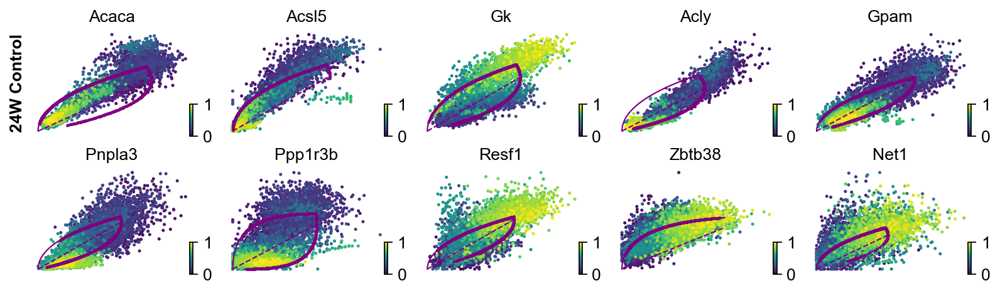

/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/envs/scVelo/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/Users/derekebowman/miniconda3/env

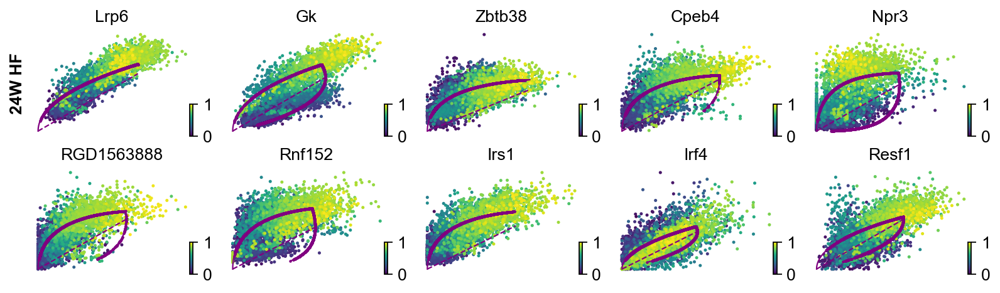

In [37]:
for cluster in ['24W_Control', '24W_HF']:
    scv.pl.scatter(adata, df[cluster][:10], ylabel=cluster, color ='latent_time',
                   color_map='viridis', frameon=False, ncols=5)

